# <font style="color:blue">Project 3: Object Detection</font>


#### Maximum Points: 100

<div>
    <table>
        <tr><td><h3>Sr. no.</h3></td> <td><h3>Section</h3></td> <td><h3>Points</h3></td> </tr>
        <tr><td><h3>1</h3></td> <td><h3>Plot Ground Truth Bounding Boxes</h3></td> <td><h3>20</h3></td> </tr>
        <tr><td><h3>2</h3></td> <td><h3>Training</h3></td> <td><h3>25</h3></td> </tr>
        <tr><td><h3>3</h3></td> <td><h3>Inference</h3></td> <td><h3>15</h3></td> </tr>
        <tr><td><h3>4</h3></td> <td><h3>COCO Detection Evaluation</h3></td> <td><h3>25</h3></td> </tr>
        <tr><td><h3>5</h3></td> <td><h3>Run Inference on a Video</h3></td> <td><h3>15</h3></td> </tr>
    </table>
</div>


# <font style="color:purple">Download the Dataset</font>

**[Download the Vehicle registration plate](https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1)**


Download the Vehicle Registration Plate dataset from [here](https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1) and unzip it.

We will have the following directory structure:

```
Dataset
├── train
│   └── Vehicle registration plate
│       └── Label
└── validation
    └── Vehicle registration plate
        └── Label
```

Unzipping the file will give you a directory `Dataset`. This directory has two folder `train` and `validation`. Each train and validation folder has `Vehicle registration plate`  folder with `.jpg` images and a folder `Labels`.  `Labels` folder has bounding box data for the images.


For example,
For image: `Dataset/train/Vehicle registration plate/bf4689922cdfd532.jpg`
Label file is  `Dataset/train/Vehicle registration plate/Label/bf4689922cdfd532.txt`

There are one or more lines in each `.txt` file. Each line represents one bounding box.
For example,
```
Vehicle registration plate 385.28 445.15 618.24 514.225
Vehicle registration plate 839.68 266.066462 874.24 289.091462
```

We have a single class detection (`Vehicle registration plate detection`) problem. So bounding box details start from the fourth column in each row.

Representation is in `xmin`, `ymin`, `xmax`, and `ymax` format.

**It has `5308` training and `386` validation dataset.**

Data is downloaded from [Open Images Dataset](https://storage.googleapis.com/openimages/web/index.html)

In [1]:
!wget "https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1" -O data.zip

--2024-09-01 13:03:30--  https://www.dropbox.com/s/k81ljpmzy3fgtx9/Dataset.zip?dl=1
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/3i8vy6k6t56sjbmy81nnc/Dataset.zip?rlkey=thbyhjvwmqfe5xswkfaprtzyb&dl=1 [following]
--2024-09-01 13:03:32--  https://www.dropbox.com/scl/fi/3i8vy6k6t56sjbmy81nnc/Dataset.zip?rlkey=thbyhjvwmqfe5xswkfaprtzyb&dl=1
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc6cf21b3fcfa7b103687c87e5a6.dl.dropboxusercontent.com/cd/0/inline/CZurfvByVV7y_rVZb84mdT4aClwguWexZ-jil-v9Ny8ZWTvWzr_CgIzNq-dzqgcIyDEe-h0sPVW6MDcyEdItO8uRf7zkbKmPUREHiR6NfB62yNYv1xfE6Se_N8HNAEYOZHVE57A5jIgOIbi5E5FN_03j/file?dl=1# [following]
--2024-09-01 13:03:32--  https://uc6cf21b3fcfa7b103687c87e5a6.dl.dropboxusercontent.

In [2]:
!unzip -q data.zip

In [3]:
!rm -rf /content/data.zip

#  <font style="color:green">1. Plot Ground Truth Bounding Boxes [20 Points]</font>

**You have to show three images from validation data with the bounding boxes.**

The plotted images should be similar to the following:

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-g1.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-g2.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-g3.png'>



Create a Seperate folder for Images as they are not structured properly

### Data Cleaning

Creating a folder to store Images in both Train and Test Set

In [4]:
import os
import shutil
# Create directories
def move_images(source_data_path):
  img_data_path=source_data_path+'/images'
  os.makedirs(img_data_path, exist_ok=True)
  for filename in os.listdir(source_data_path):
    if filename.endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp')):  # Add any other image formats as needed
        # Construct full file path
        file_path = os.path.join(source_data_path, filename)
        # Move file
        shutil.move(file_path, img_data_path)

In [5]:
source_train_path = '/content/Dataset/train/Vehicle registration plate'
source_valid_path = '/content/Dataset/validation/Vehicle registration plate'
move_images(source_train_path)
move_images(source_valid_path)

In the text file, Label names are stored as 'Vehicle registration plate'. Change the name to 'Reg-plate' for better compatibility

In [6]:
def replace_text_in_file(file_path, old_text, new_text):
    """Replace old_text with new_text in the given file."""
    with open(file_path, 'r', encoding='utf-8') as file:
        content = file.read()

    # Replace text
    content = content.replace(old_text, new_text)

    with open(file_path, 'w', encoding='utf-8') as file:
        file.write(content)

def process_directory(directory_path, old_text, new_text):
    """Process all text files in the specified directory."""
    for filename in os.listdir(directory_path):
        if filename.endswith('.txt'):
            file_path = os.path.join(directory_path, filename)
            replace_text_in_file(file_path, old_text, new_text)
            print(f'Updated {filename}')

# Directory containing text files
train_path = '/content/Dataset/train/Vehicle registration plate/Label'
valid_path = '/content/Dataset/validation/Vehicle registration plate/Label'

# Text to be replaced
old_text = 'Vehicle registration plate'
new_text = 'Reg-plate'

# Process the directory
process_directory(train_path, old_text, new_text) # For training
process_directory(valid_path, old_text, new_text) # For Validation

Streaming output truncated to the last 5000 lines.
Updated 0181c8fe6cc0b2c8.txt
Updated 771e48e3e78b8f80.txt
Updated 06501a5ed994c937.txt
Updated 5a44dbe713274c35.txt
Updated 78af78e7f1f73ff1.txt
Updated e2380316e974586c.txt
Updated 1b13b483f752b9e6.txt
Updated dd20fad62dbf661c.txt
Updated 7b7c73aeefd5dd3b.txt
Updated bdf1cdf29dff54ee.txt
Updated fa97e44e47c01961.txt
Updated 4e087d970f0f8008.txt
Updated bd2589ffc746bdf6.txt
Updated 0a2f7b3087967dd6.txt
Updated 872781862bf30130.txt
Updated f0910fc60a687ffd.txt
Updated 1e868b85ec011407.txt
Updated cacdf1eb0e8f09a1.txt
Updated ac5b48e3d6ed6348.txt
Updated fd1488b9a895cdce.txt
Updated 01a599bd26b8ebf8.txt
Updated 002635f5f3dfd5b9.txt
Updated 6581a6fb8ddb3990.txt
Updated 195c8b3c5a32096e.txt
Updated 3af34a6337f3ff1e.txt
Updated b1bdc5e8f0555dd3.txt
Updated 1ca35bcd50d17273.txt
Updated 9d35a4333e127a4e.txt
Updated 0092a20b63799744.txt
Updated 681403c74dcef4e1.txt
Updated 56edc6c9009870c4.txt
Updated 848b549c8ab1ca8a.txt
Updated 0023f6548005e

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os
import random

def display_random_image_with_boxes(image_dir, label_dir):
    """
    Display a random image from the given directory with bounding boxes and labels from the corresponding text file.

    Parameters:
        image_dir (str): Path to the directory containing images.
        label_dir (str): Path to the directory containing label text files.
    """
    # Get a list of all image files
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

    if not image_files:
        raise ValueError("No image files found in the specified directory.")

    # Randomly select an image
    selected_image = random.choice(image_files)

    # Construct paths for the image and its label file
    image_path = os.path.join(image_dir, selected_image)
    label_path = os.path.join(label_dir, selected_image.split('.')[0] + '.txt')

    if not os.path.exists(label_path):
        raise ValueError(f"Label file for {selected_image} does not exist.")

    # Load the image
    image = cv2.imread(image_path)

    if image is None:
        raise ValueError(f"Image file {selected_image} could not be loaded.")

    # Load bounding box data from the corresponding text file
    bounding_boxes = []
    with open(label_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            if len(parts) == 5:
                label, x_min, y_min, x_max, y_max = parts
                # Convert to float first, then to int if needed
                x_min, y_min, x_max, y_max = map(int, map(float, (x_min, y_min, x_max, y_max)))
                bounding_boxes.append((label, x_min, y_min, x_max, y_max))

    # Draw bounding boxes on the image
    for (label, x_min, y_min, x_max, y_max) in bounding_boxes:
        # Draw rectangle on image (color is BGR, thickness is 2)
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (200, 213, 48), 2)
        # Calculate text size
        (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
        # Set background rectangle position
        background_x_min = x_min
        background_y_min = y_min - text_height - 10
        background_x_max = x_min + text_width
        background_y_max = y_min
        # Ensure the background rectangle is within the image bounds
        background_x_min = max(background_x_min, 0)
        background_y_min = max(background_y_min, 0)
        background_x_max = min(background_x_max, image.shape[1])
        background_y_max = min(background_y_max, image.shape[0])
        # Draw the background rectangle
        cv2.rectangle(image, (background_x_min, background_y_min), (background_x_max, background_y_max), (0, 0, 0), cv2.FILLED)
        # Put the text on the image
        cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

    # Convert BGR to RGB (OpenCV uses BGR by default)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image using matplotlib
    plt.imshow(image_rgb)
    plt.axis('off')  # Hide axes
    plt.show()


In [ ]:
image_directory = '/content/Dataset/validation/Vehicle registration plate/images'
label_directory = '/content/Dataset/validation/Vehicle registration plate/Label'

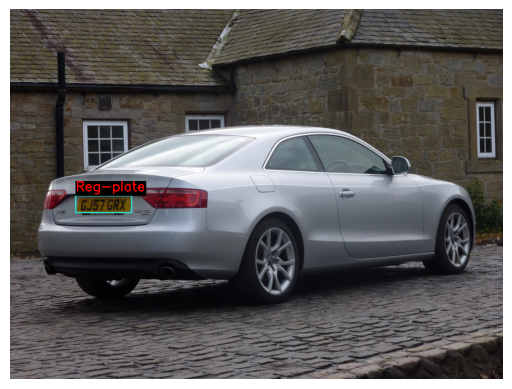

In [ ]:
display_random_image_with_boxes(image_directory, label_directory)

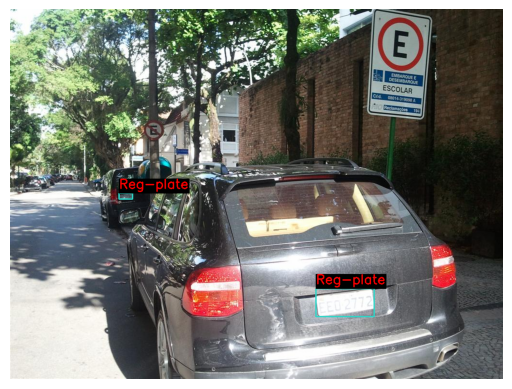

In [ ]:
display_random_image_with_boxes(image_directory, label_directory)

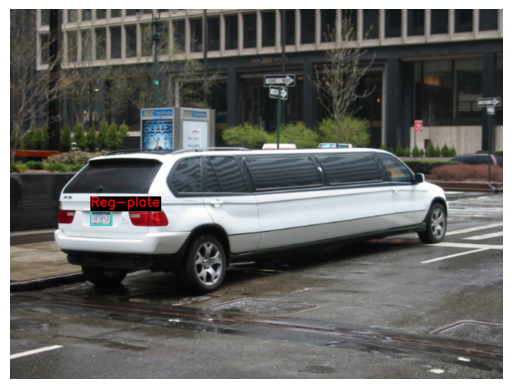

In [ ]:
display_random_image_with_boxes(image_directory, label_directory)

#  <font style="color:green">2. Training [25 Points]</font>

- **Write your training code in this section.**

- **You also have to share ([shared logs example](https://tensorboard.dev/experiment/JRtnsKbwTaq1ow6nPLPGeg)) the loss plot of your training using tensorboard.dev.**

How to share TensorBoard logs using tensorboard.dev find [here](https://courses.opencv.org/courses/course-v1:OpenCV+OpenCV-106+2019_T1/courseware/b1c43ffe765246658e537109e188addb/d62572ec8bd344db9aeae81235ede618/4?activate_block_id=block-v1%3AOpenCV%2BOpenCV-106%2B2019_T1%2Btype%40vertical%2Bblock%40398b46ddcd5c465fa52cb4d572ba3229).

In [7]:
import cv2
import os

def resize_image(image_path, output_path, target_size):
    image = cv2.imread(image_path)
    original_size = image.shape[1], image.shape[0]  # (width, height)
    resized_image = cv2.resize(image, target_size)
    cv2.imwrite(output_path, resized_image)
    return original_size  # Return original size for annotation adjustment

def process_images(input_dir, output_dir, target_size):
    original_sizes = {}  # Dictionary to store original sizes
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for filename in os.listdir(input_dir):
        if filename.endswith('.jpg') or filename.endswith('.png'):
            input_path = os.path.join(input_dir, filename)
            output_path = os.path.join(output_dir, filename)
            original_size = resize_image(input_path, output_path, target_size)
            original_sizes[filename] = original_size  # Store original size

    return original_sizes  # Return the dictionary of original sizes

# Example usage
train_dir = '/content/Dataset/train/Vehicle registration plate/images'
val_dir = '/content/Dataset/validation/Vehicle registration plate/images'
output_train_dir = '/content/License_Plate_Detection/train/images'
output_val_dir = '/content/License_Plate_Detection/validation/images'
target_size = (640, 640)  # Resize to 640x640 pixels

original_train_sizes = process_images(train_dir, output_train_dir, target_size)
original_val_sizes = process_images(val_dir, output_val_dir, target_size)


In [8]:
def convert_to_yolo_format(class_name, xmin, ymin, xmax, ymax, original_size, target_size, class_mapping):
    original_width, original_height = original_size
    target_width, target_height = target_size

    # Convert coordinates to YOLO format (normalized)
    x_center = ((float(xmin) + float(xmax)) / 2) / original_width # Convert xmin and xmax to float before calculation
    y_center = ((float(ymin) + float(ymax)) / 2) / original_height # Convert ymin and ymax to float before calculation
    width = (float(xmax) - float(xmin)) / original_width # Convert xmin and xmax to float before calculation
    height = (float(ymax) - float(ymin)) / original_height # Convert ymin and ymax to float before calculation

    # Map class name to class ID
    class_id = class_mapping[class_name]

    return f'{class_id} {x_center} {y_center} {width} {height}'

def resize_annotations_to_yolo(annotation_file, output_file, original_size, target_size, class_mapping):
    with open(annotation_file, 'r') as file:
        lines = file.readlines()

    with open(output_file, 'w') as file:
        for line in lines:
            parts = line.strip().split()
            class_name = parts[0]
            xmin = float(parts[1]) # Convert xmin to float
            ymin = float(parts[2]) # Convert ymin to float
            xmax = float(parts[3]) # Convert xmax to float
            ymax = float(parts[4]) # Convert ymax to float

            yolo_format_line = convert_to_yolo_format(class_name, xmin, ymin, xmax, ymax, original_size, target_size, class_mapping)
            file.write(yolo_format_line + '\n')

# ... (rest of the code remains the same)

def process_annotations_to_yolo(input_dir, output_dir, original_sizes, target_size, class_mapping):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for filename in os.listdir(input_dir):
        if filename.endswith('.txt'):
            input_path = os.path.join(input_dir, filename)
            output_path = os.path.join(output_dir, filename)
            original_size = original_sizes.get(filename.replace('.txt', '.jpg')) or original_sizes.get(filename.replace('.txt', '.png'))
            if original_size:
                resize_annotations_to_yolo(input_path, output_path, original_size, target_size, class_mapping)

# Example usage
annotation_train_dir = '/content/Dataset/train/Vehicle registration plate/Label'
annotation_val_dir = '/content/Dataset/validation/Vehicle registration plate/Label'
output_annotation_train_dir = '/content/License_Plate_Detection/train/labels'
output_annotation_val_dir = '/content/License_Plate_Detection/validation/labels'
target_size = (640, 640)  # Resize target

# Mapping from class names to IDs
class_mapping = {
    'Reg-plate': 0,
}

process_annotations_to_yolo(annotation_train_dir, output_annotation_train_dir, original_train_sizes, target_size, class_mapping)
process_annotations_to_yolo(annotation_val_dir, output_annotation_val_dir, original_val_sizes, target_size, class_mapping)


In [9]:
!rm -r /content/Dataset/

In [ ]:
import cv2
import os
import random
import matplotlib.pyplot as plt

# Set the paths to your image and annotation directories
image_dir = '/content/License_Plate_Detection/validation/images'
annotation_dir = '/content/License_Plate_Detection/validation/labels'

# Function to parse a YOLO annotation file
def load_yolo_annotations(annotation_file):
    boxes = []
    with open(annotation_file, 'r') as file:
        lines = file.readlines()
        for line in lines:
            class_id, x_center, y_center, width, height = map(float, line.strip().split())
            boxes.append((class_id, x_center, y_center, width, height))
    return boxes

# Function to display image with annotations
def display_image_with_annotations(image_path, annotation_file):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for displaying with Matplotlib
    height, width, _ = image.shape

    boxes = load_yolo_annotations(annotation_file)

    for box in boxes:
        class_id, x_center, y_center, w, h = box
        # Convert normalized coordinates back to pixel coordinates
        x_center *= width
        y_center *= height
        w *= width
        h *= height
        xmin = int(x_center - w / 2)
        ymin = int(y_center - h / 2)
        xmax = int(x_center + w / 2)
        ymax = int(y_center + h / 2)

        # Draw the bounding box on the image
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)  # Blue box
        cv2.putText(image, 'Reg-plate', (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Pick a random image and display it with its annotations
def display_random_image_with_annotations(image_dir, annotation_dir):
    images = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]
    if not images:
        print("No images found in the directory.")
        return

    random_image = random.choice(images)
    image_path = os.path.join(image_dir, random_image)
    annotation_file = os.path.join(annotation_dir, random_image.replace('.jpg', '.txt').replace('.png', '.txt'))

    if os.path.exists(annotation_file):
        display_image_with_annotations(image_path, annotation_file)
    else:
        print(f"No annotation found for {random_image}")

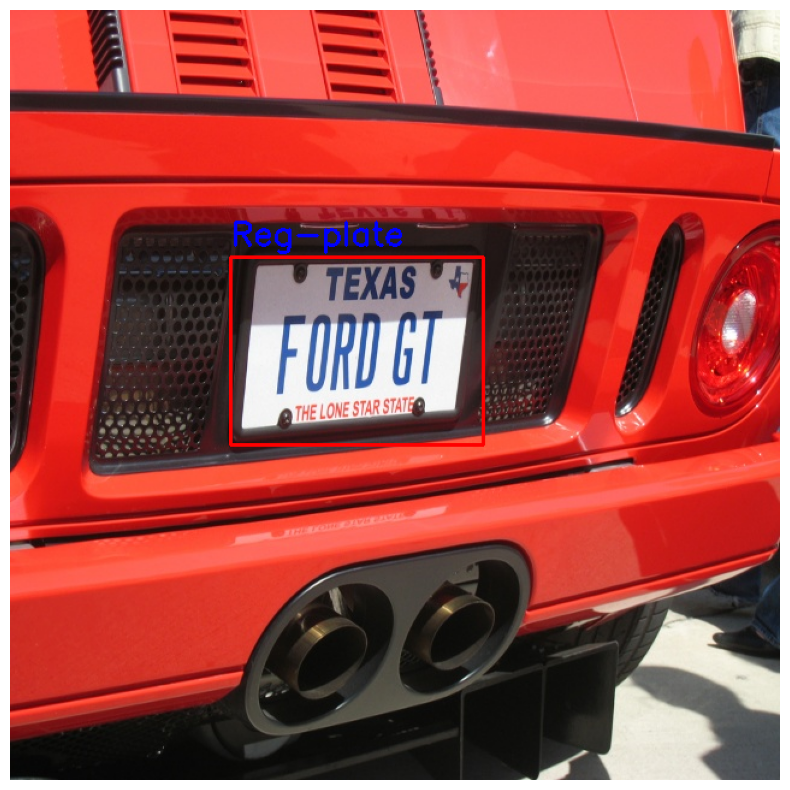

In [ ]:
display_random_image_with_annotations(image_dir, annotation_dir) #Running Sanity Check after Conversion

In [10]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16927, done.
remote: Counting objects: 100% (122/122), done.
remote: Compressing objects: 100% (75/75), done.
remote: Total 16927 (delta 62), reused 86 (delta 47), pack-reused 16805 (from 1)
Receiving objects: 100% (16927/16927), 15.69 MiB | 14.63 MiB/s, done.
Resolving deltas: 100% (11595/11595), done.


In [11]:
%cd yolov5

/content/yolov5


In [12]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.3/872.3 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.5 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0


In [1]:
%%writefile /content/yolov5/data.yaml
train: /content/License_Plate_Detection/train/images
val: /content/License_Plate_Detection/validation/images
nc: 1
names: ['Reg-plate']

Writing /content/yolov5/data.yaml


In [ ]:
%%writefile /content/yolov5/data/hyps/hyp.scratch-low.yaml
# YOLOv5 Hyperparameters
# hyperparameters used to train the YOLOv5 model

# Optimizer settings
optimizer: Adam  # choices: ['SGD', 'Adam']

# Learning rate settings
lr0: 0.001  # initial learning rate
lrf: 0.2  # final OneCycleLR learning rate (lr0 * lrf)

# Momentum and weight decay
momentum: 0.937  # SGD momentum/Adam beta1
weight_decay: 0.0005  # optimizer weight decay
adam_betas: [0.9, 0.999]  # Adam betas for beta1 and beta2

# LR schedule
warmup_epochs: 3.0  # warmup epochs (fractions ok)
warmup_momentum: 0.8  # warmup initial momentum
warmup_bias_lr: 0.1  # warmup initial bias lr
box: 0.05  # box loss gain
cls: 0.5  # cls loss gain
cls_pw: 1.0  # cls BCELoss positive_weight
obj: 1.0  # obj loss gain (scale with pixels)
obj_pw: 1.0  # obj BCELoss positive_weight
iou_t: 0.2  # IoU training threshold
anchor_t: 4.0  # anchor-multiple threshold
fl_gamma: 0.0  # focal loss gamma (efficientDet default gamma=1.5)
hsv_h: 0.015  # image HSV-Hue augmentation (fraction)
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction)
hsv_v: 0.4  # image HSV-Value augmentation (fraction)
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)
copy_paste: 0.0  # segment copy-paste (probability)

# Augmentation
degrees: 0.0  # image rotation (+/- deg)
translate: 0.1  # image translation (+/- fraction)
scale: 0.5  # image scale (+/- gain)
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction)
flipud: 0.0  # image flip up-down (probability)
fliplr: 0.5  # image flip left-right (probability)
mosaic: 1.0  # image mosaic (probability)
mixup: 0.0  # image mixup (probability)

# Multi-scale settings
scale_fill: false  # fill during scaleup (default False)

# Batch normalization
bn_momentum: 0.03  # BatchNorm momentum (default 0.03)
bn_eps: 0.001  # BatchNorm epsilon (default 1e-3)

# Label smoothing
label_smoothing: 0.0  # Label smoothing epsilon (fraction)

Overwriting /content/yolov5/data/hyps/hyp.scratch-low.yaml


In [1]:
%cd yolov5

/content/yolov5


In [ ]:
!pip install wandb

In [ ]:
import wandb
wandb.login()

wandb: Currently logged in as: furqansa344 (furqansa344-na). Use `wandb login --relogin` to force relogin


True

In [ ]:
!python train.py --img 640 --batch 32 --epochs 25 --data data.yaml --cfg models/yolov5s.yaml --weights yolov5s.pt --optimizer Adam --hyp data/hyps/hyp.scratch-low.yaml --project opencv_od_project --name license_plate_detection

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
      10/24      8.58G    0.03742   0.008218          0         69        640:  33% 54/166 [00:51<02:48,  1.50s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/24      8.58G    0.03745   0.008212          0         56        640:  33% 55/166 [00:51<02:14,  1.22s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      10/24      8.58G     0.0374   0.008226          0         64        640:  34% 56/166 [00:54<02:47,  1.52s/it]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp

In [ ]:
%load_ext tensorboard
%tensorboard --logdir opencv_od_project

<IPython.core.display.Javascript object>

#  <font style="color:green">3. Inference [15 Points]</font>

**You have to make predictions from your trained model on three images from the validation dataset.**

The plotted images should be similar to the following:

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-p1.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-p2.png'>



<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w10-p3.png'>




### Downloading pretrained model uploaded on drive

In [6]:
%cd /content/yolov5

/content/yolov5


In [2]:
!gdown --id 1lgsIbxC48FHjnavA-dh8yyHIFJfYRYFI

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1lgsIbxC48FHjnavA-dh8yyHIFJfYRYFI
To: /content/yolov5/best.pt
100% 14.4M/14.4M [00:01<00:00, 10.9MB/s]


In [8]:
!python detect.py --weights /content/yolov5/best.pt --img 640 --conf 0.5 --source  /content/License_Plate_Detection/validation/images --save-conf --save-txt

detect: weights=['/content/yolov5/best.pt'], source=/content/License_Plate_Detection/validation/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-362-ge8a30cf8 Python-3.10.12 torch-2.4.0+cu121 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/386 /content/License_Plate_Detection/validation/images/003a5aaf6d17c917.jpg: 640x640 1 Reg-plate, 452.2ms
image 2/386 /content/License_Plate_Detection/validation/images/00723dac8201a83e.jpg: 640x640 2 Reg-plates, 434.1ms
image 3/386 /content/License_Plate_Detection/validation/images/008637722500f239.jpg: 6

In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt

def read_yolo_boxes(file_path, image_width, image_height):
    """Read bounding boxes and confidence scores from a file and convert to pixel coordinates."""
    boxes = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center = float(parts[1]) * image_width  # Convert normalized x_center to pixel coordinate
            y_center = float(parts[2]) * image_height # Convert normalized y_center to pixel coordinate
            width = float(parts[3]) * image_width    # Convert normalized width to pixel width
            height = float(parts[4]) * image_height   # Convert normalized height to pixel height
            confidence = float(parts[5])

            # Calculate x_min, y_min, x_max, y_max from center, width, and height
            x_min = int(x_center - width / 2)
            y_min = int(y_center - height / 2)
            x_max = int(x_center + width / 2)
            y_max = int(y_center + height / 2)

            # Append the box information
            boxes.append((class_id, confidence, x_min, y_min, x_max, y_max))
    return boxes

def draw_boxes(image, boxes):
    """Draw bounding boxes and confidence scores on the image."""
    for box in boxes:
        class_id, confidence, x_min, y_min, x_max, y_max = box
        # Draw rectangle
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 255), 2)
        # Draw label with confidence score
        label = f"{int(confidence*100)}%"
        cv2.putText(image, label, (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 255), 2)
    return image

def display_random_image_with_boxes(image_dir, label_dir):
    """Display a random image with bounding boxes and confidence scores from separate directories using Matplotlib."""
    # List all image files in the image directory
    image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
    image_files = [f for f in image_files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

    if not image_files:
        print("No image files found in the directory.")
        return

    # Choose a random image file
    random_image_file = random.choice(image_files)
    image_path = os.path.join(image_dir, random_image_file)

    # Load the corresponding YOLO bounding box file
    label_file = os.path.splitext(random_image_file)[0] + '.txt'
    label_path = os.path.join(label_dir, label_file)

    if not os.path.exists(label_path):
        print(f"No label file found for {random_image_file}.")
        return

    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print("Failed to load image.")
        return
    image_height, image_width = image.shape[:2]

    # Convert BGR image to RGB for Matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Read YOLO boxes
    boxes = read_yolo_boxes(label_path, image_width, image_height)

    # Draw boxes on the image
    image_with_boxes = draw_boxes(image_rgb, boxes)

    # Display the image using Matplotlib
    plt.figure(figsize=(20, 10))
    plt.imshow(image_with_boxes)
    plt.axis('off')  # Hide the axis
    plt.show()


In [ ]:
image_directory = '/content/License_Plate_Detection/validation/images'
labels_directory = '/content/yolov5/runs/detect/exp/labels'

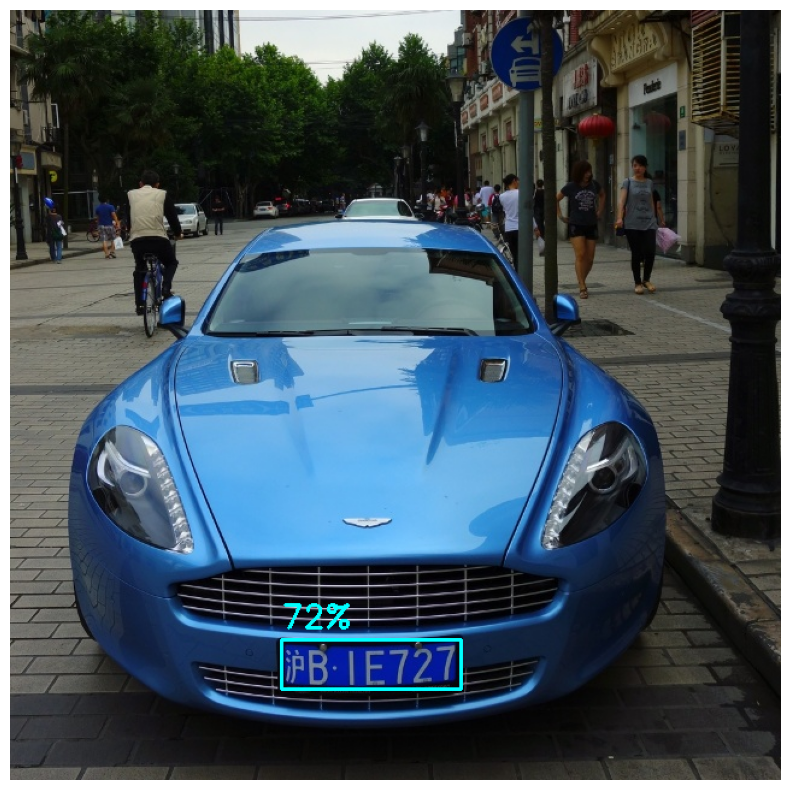

In [ ]:
display_random_image_with_boxes(image_directory, labels_directory)

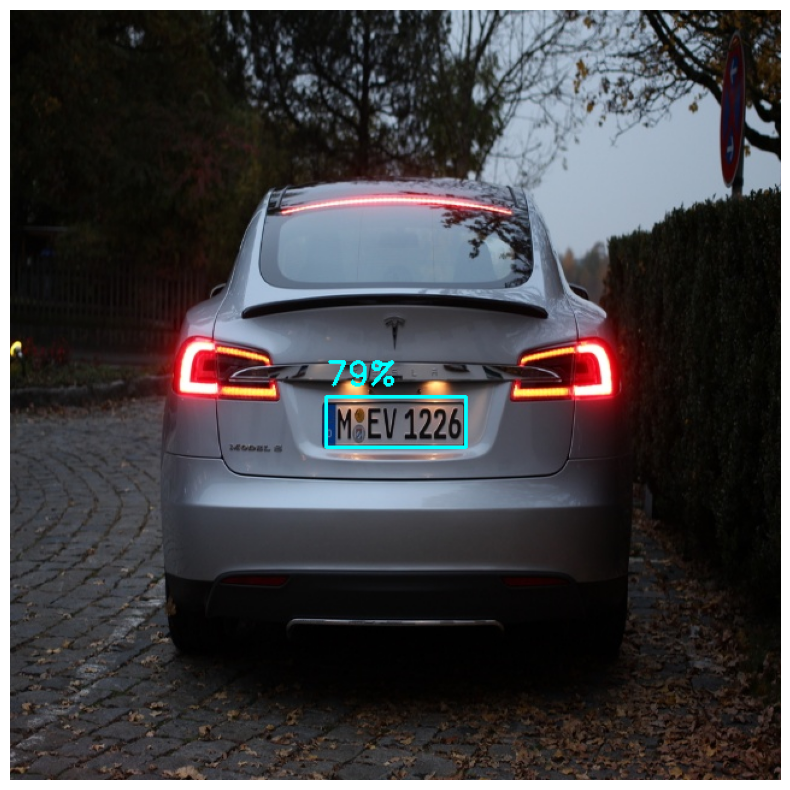

In [ ]:
display_random_image_with_boxes(image_directory, labels_directory)

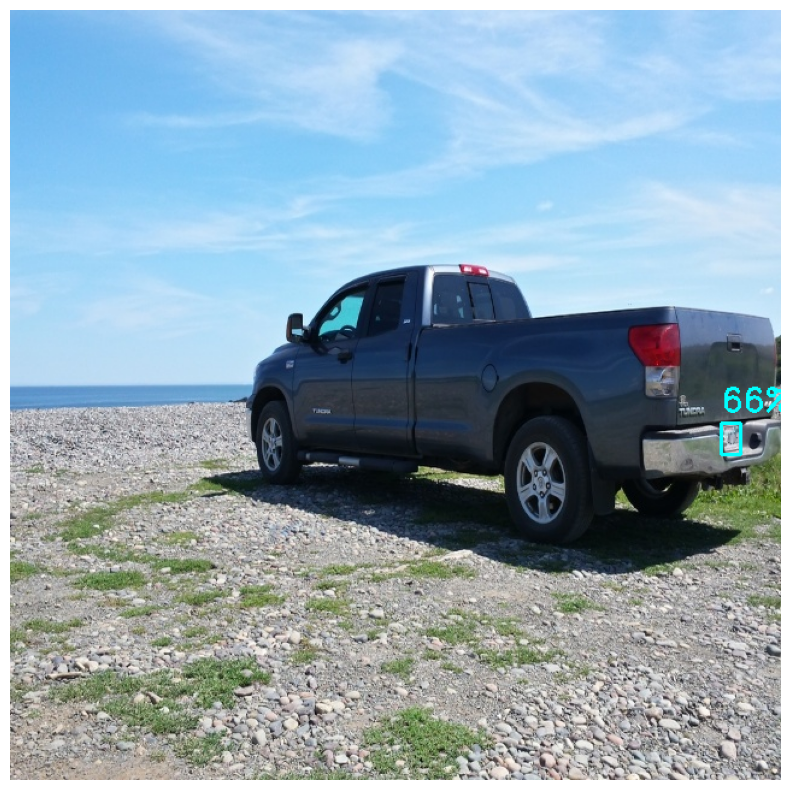

In [ ]:
display_random_image_with_boxes(image_directory, labels_directory)

#  <font style="color:green">4. COCO Detection Evaluation [25 Points]</font>

**You have to evaluate your detection model on COCO detection evaluation metric.**

For your reference here is the coco evaluation metric chart:


---

<img src="https://www.learnopencv.com/wp-content/uploads/2020/03/c3-w9-coco_metric.png">

---

#### <font style="color:red">The expected `AP` (primary challenge metric) is more than `0.5`.</font>

**The expected output should look similar to the following:**

```
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.550
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.886
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.629
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.627
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.504
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.629
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.633
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.722
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.704
```



In [9]:
import json
import os
from PIL import Image

In [10]:
def convert_yolo_to_coco(image_dir, annotation_dir, output_dir, categories, filename):
    # Define the COCO dataset dictionary
    coco_dataset = {
        "info": {},
        "licenses": [],
        "categories": categories,
        "images": [],
        "annotations": []
    }

    image_id_counter = 1 # Initialize an image ID counter

    # Loop through the images in the image directory
    for image_file in os.listdir(image_dir):
        if not image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue  # Skip non-image files

        # Load the image and get its dimensions
        image_path = os.path.join(image_dir, image_file)
        image = Image.open(image_path)
        width, height = image.size

        # Add the image to the COCO dataset
        image_dict = {
            "id": image_id_counter,  # Use the counter for image ID
            "width": width,
            "height": height,
            "file_name": image_file
        }
        coco_dataset["images"].append(image_dict)

        # Increment the image ID counter
        image_id_counter += 1

        # Load the bounding box annotations for the image
        annotation_file = os.path.join(annotation_dir, f'{image_file.split(".")[0]}.txt')
        if not os.path.exists(annotation_file):
            continue  # Skip if annotation file does not exist

        with open(annotation_file) as f:
            annotations = f.readlines()

        # Loop through the annotations and add them to the COCO dataset
        for ann in annotations:
            parts = ann.strip().split()
            if len(parts) < 4:
                continue  # Skip if annotation is incomplete

            x, y, w, h = map(float, parts[:4])
            score = float(parts[5]) if len(parts) == 6 else None

            x_min = int((x - w / 2) * width)
            y_min = int((y - h / 2) * height)
            x_max = int((x + w / 2) * width)
            y_max = int((y + h / 2) * height)

            ann_dict = {
                "id": len(coco_dataset["annotations"]),
                "image_id": image_id_counter - 1,  # Use the counter for image ID
                "category_id": 0,
                "bbox": [x_min, y_min, x_max - x_min, y_max - y_min],
                "area": (x_max - x_min) * (y_max - y_min),
                "iscrowd": 0
            }
            if score is not None:
                ann_dict["score"] = score

            coco_dataset["annotations"].append(ann_dict)

    # Save the COCO dataset to a JSON file with the specified filename
    output_path = os.path.join(output_dir, filename)
    with open(output_path, 'w') as f:
        json.dump(coco_dataset, f, indent=4)


In [11]:
image_dir='/content/License_Plate_Detection/validation/images'
annotation_dir='/content/License_Plate_Detection/validation/labels'
output_dir='/content'
filename='ground_truth_annotations.json'
categories = [
    {"id": 0, "name": "License Plate"}
]
convert_yolo_to_coco(image_dir, annotation_dir, output_dir, categories, filename)

In [12]:
pred_annotations = '/content/yolov5/runs/detect/exp/labels'
filename='pred_annotations.json'
convert_yolo_to_coco(image_dir, pred_annotations, output_dir, categories, filename)

In [13]:
from pycocotools.cocoeval import COCOeval
from pycocotools import coco
import json

# Load ground truth COCO annotations
coco_gt = coco.COCO('/content/ground_truth_annotations.json')

# Load predicted results
with open('/content/pred_annotations.json') as f:
    coco_results = json.load(f)

# Check if annotations exist and handle the case where it's empty
if 'annotations' in coco_results and coco_results['annotations']:
    # Extract the list of annotations from the dictionary
    coco_dt = coco_gt.loadRes(coco_results['annotations'])  # Pass the 'annotations' list to loadRes

    # Initialize COCO evaluation object
    coco_eval = COCOeval(coco_gt, coco_dt, 'bbox')

    # Evaluate results
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()
else:
    print("No annotations found in the predicted results.")
    # Investigate why no annotations were generated or saved

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.15s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.762
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.831
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.830
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.512
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.862
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.669
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.798
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

# <font style="color:green">5. Run Inference on a Video [15 Points]</font>

#### [Download the Input Video](https://www.dropbox.com/s/g88o4dx18zpgn8k/projet3-input-video.mp4?dl=1)

**You have to run inference on a video.**

You can download the video from [here](https://www.dropbox.com/s/g88o4dx18zpgn8k/projet3-input-video.mp4?dl=1).

#### <font style="color:red">Upload the output video on youtube and share the link. Do not upload the video in the lab.</font>

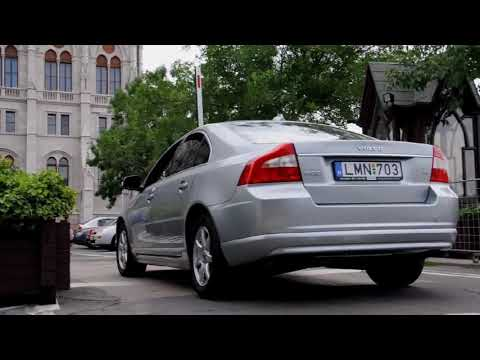

In [ ]:
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("18HWHCevFdU", width=640, height=360)
display(video)

In [ ]:
# Directly uploaded the video on the notebook server
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.5 --source  /content/projet3-input-video.mp4

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/videoplayback.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-356-g2070b303 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/130) /content/videoplayback.mp4: 384x640 (no detections), 50.8ms
video 1/1 (2/130) /content/videoplayback.mp4: 384x640 (no detections), 9.3ms
video 1/1 (3/130) /content/videoplayback.mp4: 384x640 (no detections), 7.4ms
video 1/1 (4/130) /content/videoplayback.mp4: 384x640 (no detections), 7.

**Your output video should have a bounding box around the vehicle registration plate.**

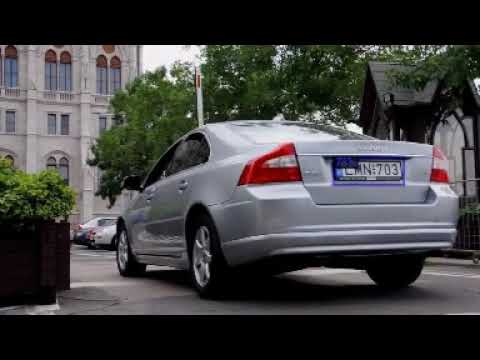

In [ ]:
video = YouTubeVideo("5SgCuee7AMs", width=640, height=360)
display(video)

<b>Showing my Output Video on the notebook</b>

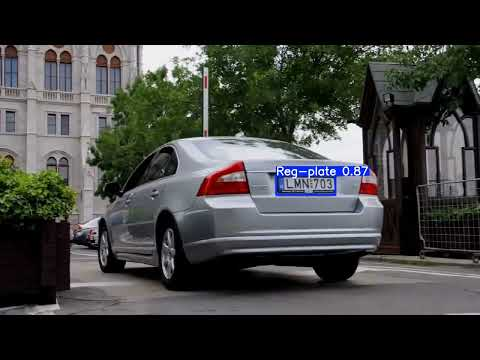

In [ ]:
video = YouTubeVideo("yCd3v3M0yF0", width=640, height=360)
display(video)

**You can use the following sample code to read and write a video.**

In [ ]:
def video_read_write(video_path):
    """
    Read video frames one-by-one, flip it, and write in the other video.
    video_path (str): path/to/video
    """
    video = cv2.VideoCapture(video_path)

    # Check if camera opened successfully
    if not video.isOpened():
        print("Error opening video file")
        return

    # create video writer
    width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    frames_per_second = video.get(cv2.CAP_PROP_FPS)
    num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

    output_fname = '{}_out.mp4'.format(os.path.splitext(video_path)[0])

    output_file = cv2.VideoWriter(
        filename=output_fname,
        # some installation of opencv may not support x264 (due to its license),
        # you can try other format (e.g. MPEG)
        fourcc=cv2.VideoWriter_fourcc(*"x264"),
        fps=float(frames_per_second),
        frameSize=(width, height),
        isColor=True,
    )


    i = 0
    while video.isOpened():
        ret, frame = video.read()
        if ret:

            output_file.write(frame[:, ::-1, :])
#             cv2.imwrite('anpd_out/frame_{}.png'.format(str(i).zfill(3)), frame[:, ::-1, :])
            i += 1
        else:
            break

    video.release()
    output_file.release()

    return